In [1]:
from google.colab import drive

drive.mount('/content/MyDrive')

Drive already mounted at /content/MyDrive; to attempt to forcibly remount, call drive.mount("/content/MyDrive", force_remount=True).


In [2]:
! pip install kornia

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import cv2
import scipy.spatial
import kornia
import random 

# Part A

## 1- Preprocessing

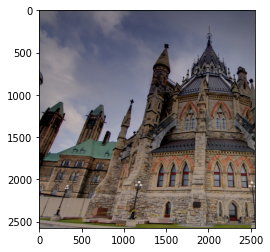

In [4]:
img_left = plt.imread('/content/MyDrive/MyDrive/Computer Vision/A3/parliament/parliament-left.jpg')
plt.imshow(img_left)

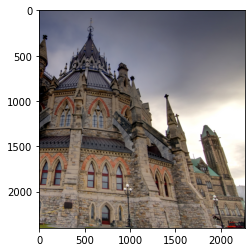

In [5]:
img_right = plt.imread('/content/MyDrive/MyDrive/Computer Vision/A3/parliament/parliament-right.jpg')
plt.imshow(img_right)

In [6]:
img_left_gray = cv2.cvtColor(img_left, cv2.COLOR_BGR2GRAY)
img_right_gray = cv2.cvtColor(img_right, cv2.COLOR_BGR2GRAY)

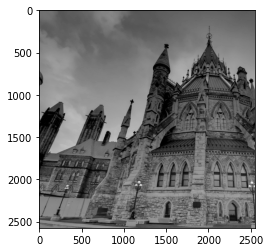

In [7]:
plt.imshow(img_left_gray, cmap='gray')

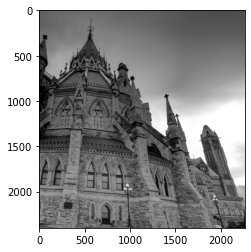

In [8]:
plt.imshow(img_right_gray, cmap='gray')

## 2- Detect keypoints and extract descriptors

In [9]:
def KPDetection(gray_img):
  sift = cv2.SIFT_create()
  img_kp, img_des = sift.detectAndCompute(gray_img, None)
  img_cpy = gray_img.copy()
  img_with_kp = cv2.drawKeypoints(gray_img, img_kp, img_cpy, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  return img_kp, img_des, img_with_kp

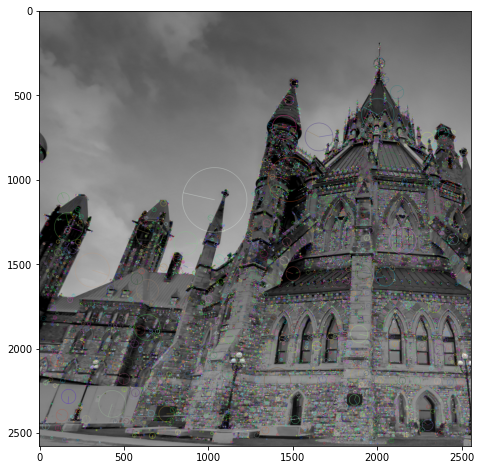

In [10]:
KP_left, descriptor_left, KP_left_toShow = KPDetection(img_left_gray)
plt.figure(figsize=(8, 8))
plt.imshow(KP_left_toShow)

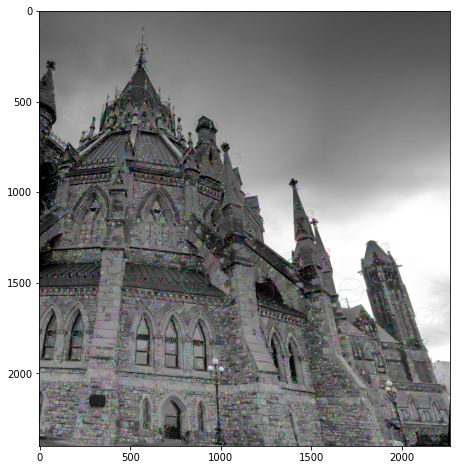

In [11]:
KP_right, descriptor_right ,KP_right_toShow = KPDetection(img_right_gray)
plt.figure(figsize=(8, 8))
plt.imshow(KP_right_toShow)

## 3- Match features

In [12]:
def calculate_distance(descriptor_left, descriptor_right):
  dists = scipy.spatial.distance.cdist(descriptor_left, descriptor_right,'sqeuclidean')
  return dists

In [13]:
dists = calculate_distance(descriptor_left, descriptor_right)
dists.shape

(16264, 17392)

## 4- Prune features

In [14]:
def prune_features(dists, KP_right_coordinates, KP_left_coordinates, thresh):
    min_idx = np.argwhere(dists < thresh)
    computed_inliers = np.zeros((min_idx.shape[0], 4))
    for i in range(min_idx.shape[0]):
      computed_inliers[i] = np.array([KP_left_coordinates[min_idx[i, 0], 0], KP_left_coordinates[min_idx[i, 0], 1], KP_right_coordinates[min_idx[i, 1], 0], KP_right_coordinates[min_idx[i, 1], 1]])
    return computed_inliers

In [15]:
dists.min(), dists.max()

(88.0, 504652.0)

In [16]:
KP_right_coordinates = cv2.KeyPoint_convert(KP_right)
KP_left_coordinates = cv2.KeyPoint_convert(KP_left)
computed_inliers = prune_features(dists, KP_right_coordinates, KP_left_coordinates, thresh=300)

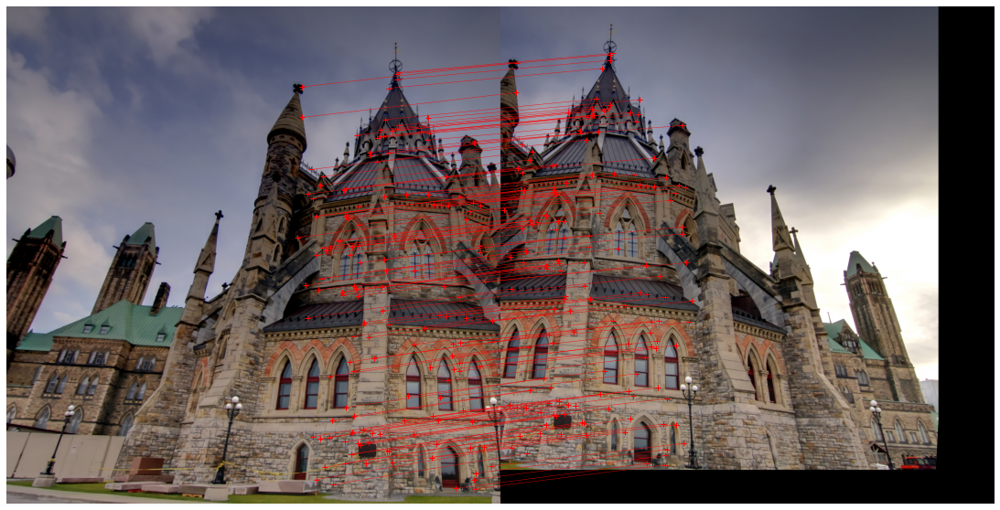

In [17]:
# Provided code for plotting inlier matches between two images

def plot_inlier_matches(ax, img1, img2, inliers):
    """
    Plot the matches between two images according to the matched keypoints
    :param ax: plot handle
    :param img1: left image
    :param img2: right image
    :inliers: x,y in the first image and x,y in the second image (Nx4)
    """
    img2_resized = np.zeros(img1.shape)
    img2_resized[0:2400, 0:2266] = img2
    res = np.hstack([img1, img2_resized])
    ax.set_aspect('equal')
    ax.imshow(res, cmap='gray')
    
    ax.plot(inliers[:,0], inliers[:,1], '+r')
    ax.plot(inliers[:,2] + img1.shape[1], inliers[:,3], '+r')
    ax.plot([inliers[:,0], inliers[:,2] + img1.shape[1]],
            [inliers[:,1], inliers[:,3]], 'r', linewidth=0.4)
    ax.axis('off')
    
# Usage:
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, img_left.astype(float) / 255., img_right.astype(float) / 255., computed_inliers)

## 5- Robust transformation estimation

In [18]:
computed_inliers[0]

array([1502.60241699, 1197.40063477,   21.17756462, 1053.52197266])

In [19]:
range(len(computed_inliers))

range(0, 151)

Affine transform: \\
| x' | = | a b | * | x | + | e | \\
| y' | = | c d | * | y | + | f |

In [20]:
import random 


def affine_transform_inv(points):
  temp = []
  pt_src = []
  pt_dest = []
  for i in range(len(points)):
    pt_src.append(points[i, 0:2])
    pt_dest.append(points[i, 2:4])

    temp.append([pt_src[i][0], pt_src[i][1], 0, 0, 1, 0])
    temp.append([0, 0, pt_src[i][0], pt_src[i][1], 0, 1])
  tmp = np.array(temp)
  pt_dest = np.array(pt_dest)
  b = pt_dest.reshape((2*len(points), 1))
  try:
    affine = np.dot(np.linalg.inv(temp), b)
    R, t = affine[0:4].reshape((2, 2)), affine[4:]
  except np.linalg.linalg.LinAlgError:
    R, t = None, None
  return R, t

def affine_transform_lsqrt(points):
  temp = []
  pt_src = []
  pt_dest = []
  for i in range(len(points)):
    pt_src.append(points[i, 0:2])
    pt_dest.append(points[i, 2:4])

    temp.append([pt_src[i][0], pt_src[i][1], 0, 0, 1, 0])
    temp.append([0, 0, pt_src[i][0], pt_src[i][1], 0, 1])
  tmp = np.array(temp)
  pt_dest = np.array(pt_dest)
  b = pt_dest.reshape((2*len(points), 1))
  try:
    affine = np.linalg.lstsq(temp, b, rcond=None)[0]
    R = affine[:4].reshape((2, 2))
    t = affine[4:]
  except np.linalg.linalg.LinAlgError:
    R, t = None, None
  return R, t

def count_inliers(estimated_pts, dest_pts, radious_thresh):
   diffs = estimated_pts - dest_pts
   radious = np.sqrt(np.sum(np.power(diffs, 2), axis=1))
   inlier_idx = np.argwhere(radious < radious_thresh)
   return inlier_idx


def ransac(computed_inliers, iterations, error_thresh):
  max_inlier_count = 0
  inliers_best, R_best, t_best = None, None, None

  for i in range(iterations):
    # Take 3 random points
    n = 3
    len_inliers = len(computed_inliers)
    pts = np.array([computed_inliers[i] for i in random.sample(range(0, len_inliers), n)])

    #find affine transform
    R, t = affine_transform_inv(pts)

    #compute inliers
    src_pts = computed_inliers[:, 0:2]
    dest_pts = computed_inliers[:, 2:4]
    estimated_pts = (np.dot(R, src_pts.T) + t).T
    inlier_idx = count_inliers(estimated_pts, dest_pts, error_thresh)

    if len(inlier_idx) > max_inlier_count:
      max_inlier_count = len(inlier_idx)
      inliers_best = computed_inliers[inlier_idx]

  return inliers_best

In [21]:
inliers_best = ransac(computed_inliers, iterations=100, error_thresh=0.1)
inliers_best.shape

(109, 1, 4)

## 6- Compute optimal transformation

In [22]:
best_R, best_t = affine_transform_lsqrt(inliers_best[:, 0, :])
best_M = np.concatenate((best_R, best_t.reshape((2, 1))), axis=1)
best_M

array([[ 9.78303294e-01, -5.12458779e-02, -1.38749389e+03],
       [ 5.12587473e-02,  9.78257143e-01, -1.94851065e+02]])

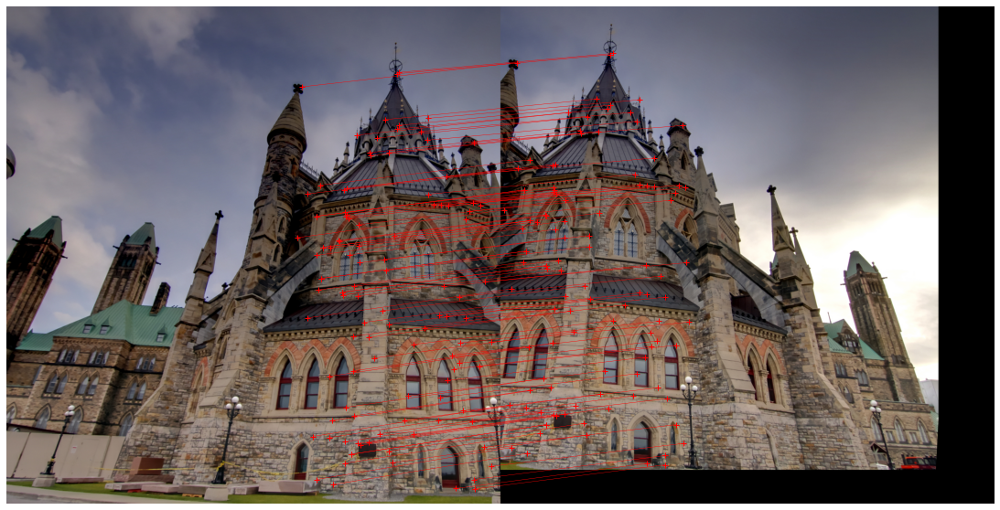

In [23]:
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, img_left.astype(float) / 255., img_right.astype(float) / 255., inliers_best[:, 0, :])

## 7- Create panorama

In [24]:
best_M

array([[ 9.78303294e-01, -5.12458779e-02, -1.38749389e+03],
       [ 5.12587473e-02,  9.78257143e-01, -1.94851065e+02]])

In [27]:
def stitch_images(img_left, img_right, M):
  # Make M 3x3
  M_3by3 = np.concatenate((M, [[0, 0, 1]]), axis=0)

  # change type
  img_left = img_left.astype(np.double) / 255.
  img_right = img_right.astype(np.double) / 255.

  # find corners of transformed left image
  y_l, x_l, c_l = img_left.shape
  corners = [[0, 0, 1], [x_l, 0, 1], [0, y_l, 1], [x_l, y_l, 1]]
  corners_new = []
  for crnr in corners:
    corners_new.append(np.dot(M_3by3, crnr))
  corners_new = np.array(corners_new).T

  x_min, y_min = min(corners_new[0]), min(corners_new[1])
  M_3by3[0][2] -= x_min
  M_3by3[1][2] -= y_min

  # Get height, width
  x_new, y_new = int(round(abs(x_min) + x_l)), int(round(abs(y_min) + y_l))
  size = (x_new, y_new)
  
  # warp left image
  warped_l = cv2.warpPerspective(src=img_left, M=M_3by3, dsize=size)

  # right image
  y_r, x_r, c_r = img_right.shape
  size = (int(round(abs(x_min) + x_r)), int(round(abs(y_min) + y_r)))
  warped_r = cv2.warpPerspective(src=img_right, M= np.array([[1, 0, -1 * min(corners_new[0])], [0, 1, -1 * min(corners_new[1])], [0, 0, 1]]), dsize=size)
     
  warped_r_resized = np.zeros((warped_l.shape[0], warped_l.shape[1], 3))
  warped_r_resized[0: warped_r.shape[0] , 0: warped_r.shape[1], :] = warped_r

  print(warped_l.shape, warped_r.shape)
  plt.imshow(warped_l)
  plt.show()
  plt.imshow(warped_r)
  plt.show()
  stiched_img = np.maximum(warped_l, warped_r_resized)
  return stiched_img

(2770, 4075, 3) (2595, 3785, 3)


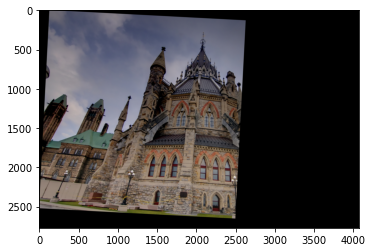

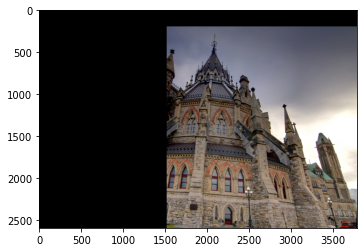

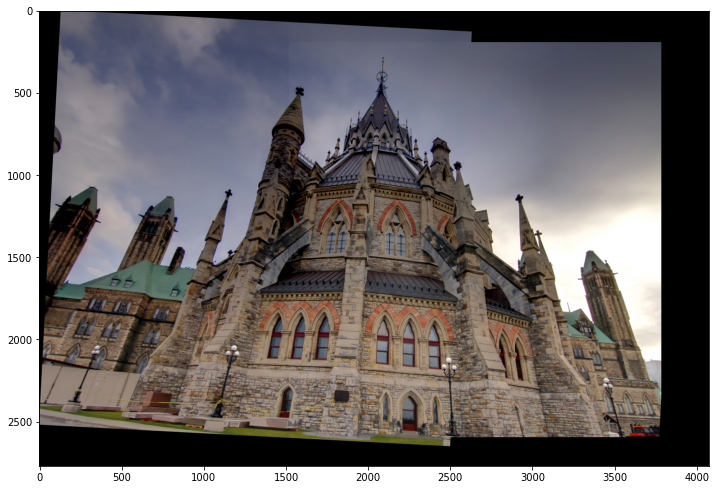

In [28]:
stiched_img = stitch_images(img_left, img_right, best_M)
plt.figure(figsize=(12,12))
plt.imshow(stiched_img)

# Part B

For this part, images were resized into smaller sizes to avoid running out of memo

## 1- Preprocessing

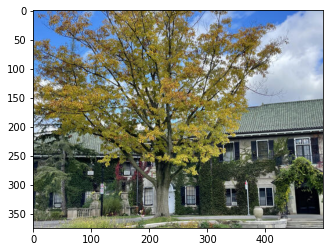

In [83]:
glendon_img_left = plt.imread('/content/MyDrive/MyDrive/Computer Vision/A3/YU_Glendon-hall_resized_3/Glendon-Hall-left.jpg')
plt.imshow(glendon_img_left)

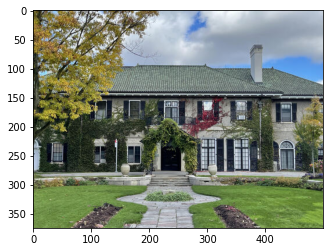

In [84]:
glendon_img_middle = plt.imread('/content/MyDrive/MyDrive/Computer Vision/A3/YU_Glendon-hall_resized_3/Glendon-Hall-middle.jpg')
plt.imshow(glendon_img_middle)

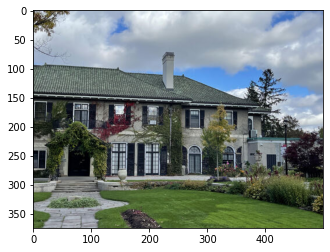

In [85]:
glendon_img_right = plt.imread('/content/MyDrive/MyDrive/Computer Vision/A3/YU_Glendon-hall_resized_3/Glendon-Hall-right.jpg')
plt.imshow(glendon_img_right)

In [86]:
glendon_img_left_gray = cv2.cvtColor(glendon_img_left, cv2.COLOR_BGR2GRAY)
glendon_img_middle_gray = cv2.cvtColor(glendon_img_middle, cv2.COLOR_BGR2GRAY)
glendon_img_right_gray = cv2.cvtColor(glendon_img_right, cv2.COLOR_BGR2GRAY)

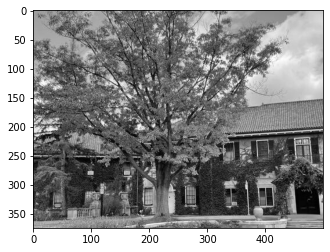

In [87]:
plt.imshow(glendon_img_left_gray, cmap='gray')

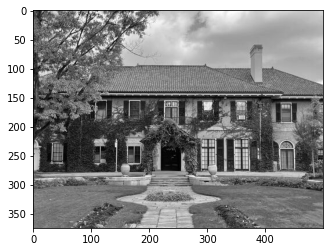

In [88]:
plt.imshow(glendon_img_middle_gray, cmap='gray')

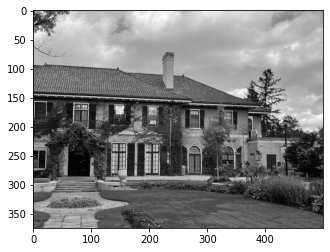

In [89]:
plt.imshow(glendon_img_right_gray, cmap='gray')

## 2- Detect keypoints and extract descriptors

In [90]:
def KPDetection(gray_img):
  sift = cv2.SIFT_create()
  img_kp, img_des = sift.detectAndCompute(gray_img, None)
  img_cpy = gray_img.copy()
  img_with_kp = cv2.drawKeypoints(gray_img, img_kp, img_cpy, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  return img_kp, img_des, img_with_kp

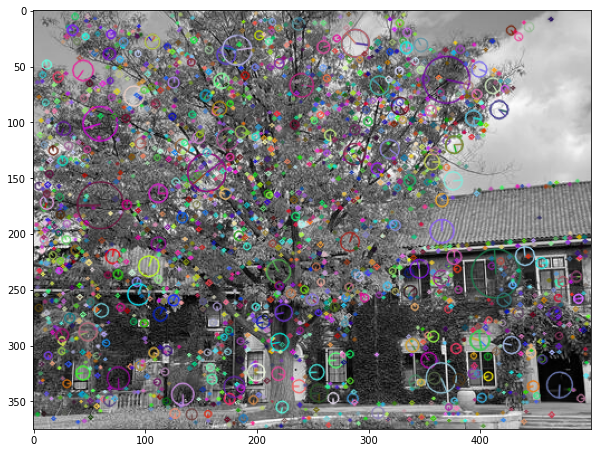

In [91]:
KP_left, descriptor_left, KP_left_toShow = KPDetection(glendon_img_left_gray)
plt.figure(figsize=(10,10))
plt.imshow(KP_left_toShow)

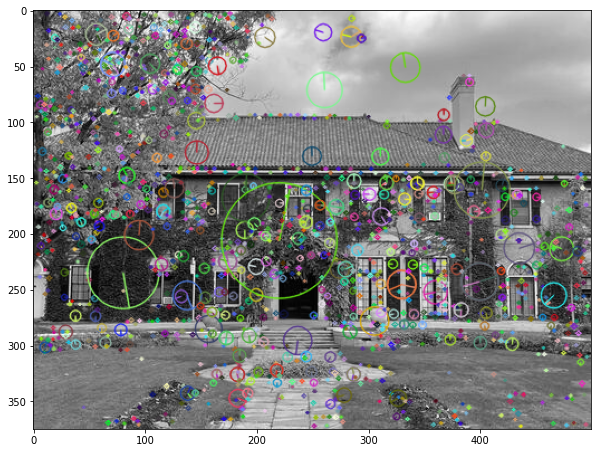

In [92]:
KP_middle, descriptor_middle ,KP_middle_toShow = KPDetection(glendon_img_middle_gray)
plt.figure(figsize=(10, 10))
plt.imshow(KP_middle_toShow)

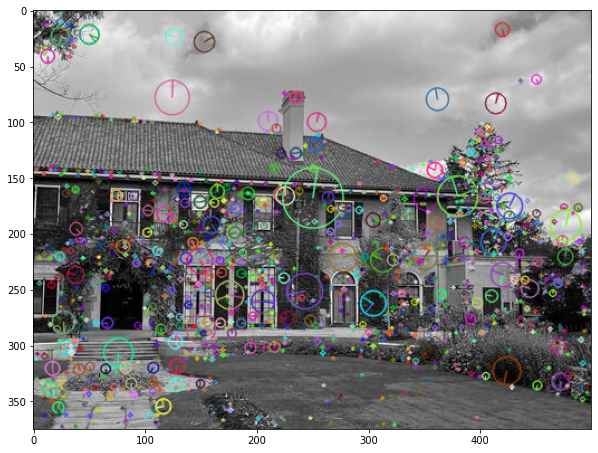

In [93]:
KP_right, descriptor_right ,KP_right_toShow = KPDetection(glendon_img_right_gray)
plt.figure(figsize=(10, 10))
plt.imshow(KP_right_toShow)

## 3- Match features

In [94]:
descriptor_left.shape, descriptor_middle.shape, descriptor_right.shape

((2321, 128), (1612, 128), (1284, 128))

In [95]:
def calculate_distance(descriptor_left, descriptor_right):
  dists = scipy.spatial.distance.cdist(descriptor_left, descriptor_right,'sqeuclidean')
  return dists

In [96]:
dists_l_m = calculate_distance(descriptor_left, descriptor_middle)
dists_r_m = calculate_distance(descriptor_right, descriptor_middle)
dists_l_m.shape, dists_r_m.shape

((2321, 1612), (1284, 1612))

In [97]:
glendon_img_right_gray.shape, glendon_img_middle_gray.shape, glendon_img_left_gray.shape

((375, 500), (375, 500), (375, 500))

## 4- Prune features

In [98]:
def prune_features(dists, KP_right_coordinates, KP_left_coordinates, thresh):
    min_idx = np.argwhere(dists < thresh)
    computed_inliers = np.zeros((min_idx.shape[0], 4))
    for i in range(min_idx.shape[0]):
      computed_inliers[i] = np.array([KP_left_coordinates[min_idx[i, 0], 0], KP_left_coordinates[min_idx[i, 0], 1], KP_right_coordinates[min_idx[i, 1], 0], KP_right_coordinates[min_idx[i, 1], 1]])
    return computed_inliers

In [99]:
KP_right_coordinates = cv2.KeyPoint_convert(KP_right)
KP_left_coordinates = cv2.KeyPoint_convert(KP_left)
KP_middle_coordinates = cv2.KeyPoint_convert(KP_middle)

computed_inliers_l_m = prune_features(dists_l_m, KP_middle_coordinates, KP_left_coordinates, thresh=3000)
computed_inliers_r_m = prune_features(dists_r_m, KP_middle_coordinates, KP_right_coordinates, thresh=3000)

In [100]:
computed_inliers_l_m.shape, computed_inliers_r_m.shape

((94, 4), (110, 4))

In [101]:
# Provided code for plotting inlier matches between two images

def plot_inlier_matches(ax, img1, img2, inliers):
    """
    Plot the matches between two images according to the matched keypoints
    :param ax: plot handle
    :param img1: left image
    :param img2: right image
    :inliers: x,y in the first image and x,y in the second image (Nx4)
    """
    img2_resized = np.zeros(img1.shape)
    img2_resized[0:375, 0:500] = img2
    res = np.hstack([img1, img2_resized])
    ax.set_aspect('equal')
    ax.imshow(res, cmap='gray')
    
    ax.plot(inliers[:,0], inliers[:,1], '+r')
    ax.plot(inliers[:,2] + img1.shape[1], inliers[:,3], '+r')
    ax.plot([inliers[:,0], inliers[:,2] + img1.shape[1]],
            [inliers[:,1], inliers[:,3]], 'r', linewidth=0.4)
    ax.axis('off')

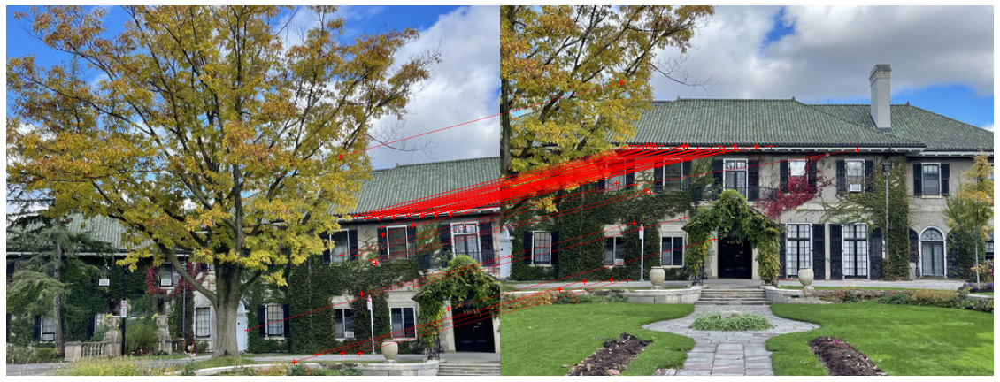

In [102]:
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, glendon_img_left.astype(float) / 255., glendon_img_middle.astype(float) / 255., computed_inliers_l_m)

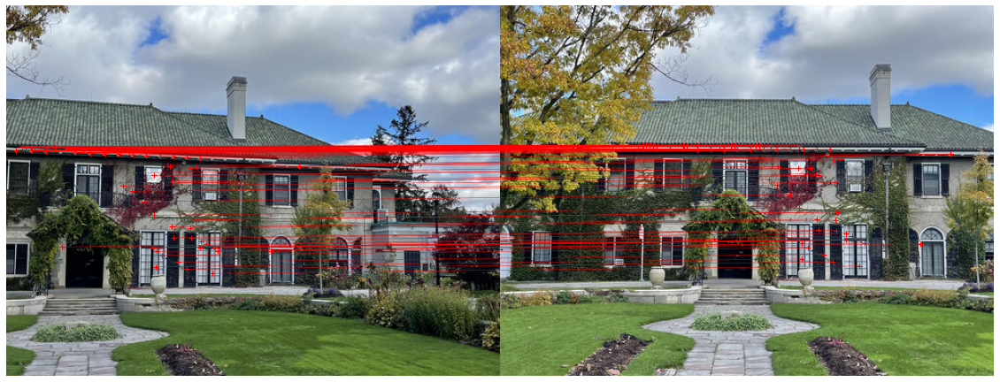

In [103]:
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, glendon_img_right.astype(float) / 255., glendon_img_middle.astype(float) / 255., computed_inliers_r_m)

## 5- Robust transformation estimation

In [104]:
computed_inliers_l_m.shape, computed_inliers_r_m.shape

((94, 4), (110, 4))

In [105]:
def compute_homography(points):
  temp = []
  pt_src = []
  pt_dest = []
  for i in range(len(points)):
    pt_src.append(points[i, 0:2])
    pt_dest.append(points[i, 2:4])

    temp.append([-pt_src[i][0], -pt_src[i][1], -1, 0, 0, 0, pt_src[i][0]*pt_dest[i][0], pt_src[i][1]*pt_dest[i][0], pt_dest[i][0]])
    temp.append([0, 0, 0, -pt_src[i][0], -pt_src[i][1], -1, pt_src[i][0]*pt_dest[i][1], pt_src[i][1]*pt_dest[i][1], pt_dest[i][1]])

  u, s, v = np.linalg.svd(np.array(temp))
  H = v[len(v)-1].reshape(3, 3)
  return H / H[2, 2]

def count_inliers(estimated_pts, dest_pts, radious_thresh):
   diffs = estimated_pts - dest_pts
   radious = np.sqrt(np.sum(np.power(diffs, 2), axis=1))
   inlier_idx = np.argwhere(radious < radious_thresh)
   return inlier_idx


def ransac(computed_inliers, iterations, error_thresh):
  max_inlier_count = 0
  inliers_best, H_best = None, None

  for i in range(iterations):
    # Take 4 random points
    n = 4
    len_inliers = len(computed_inliers)
    pts = np.array([computed_inliers[i] for i in random.sample(range(0, len_inliers), n)])

    #find affine transform
    H = compute_homography(pts)

    #compute inliers
    src_pts = np.concatenate((computed_inliers[:, 0:2], np.ones((computed_inliers.shape[0], 1))), axis=1)
    dest_pts = np.concatenate((computed_inliers[:, 2:4], np.ones((computed_inliers.shape[0], 1))), axis=1)
    estimated_pts = (np.dot(H, src_pts.T)).T
    inlier_idx = count_inliers(estimated_pts, dest_pts, error_thresh)

    if len(inlier_idx) > max_inlier_count:
      max_inlier_count = len(inlier_idx)
      inliers_best = computed_inliers[inlier_idx]
      H_best = H

  return inliers_best, H_best

In [106]:
inliers_best_l_m, best_H_l_m = ransac(computed_inliers_l_m, iterations=1000, error_thresh=150)
inliers_best_l_m.shape

(94, 1, 4)

In [107]:
inliers_best_r_m, best_H_r_m = ransac(computed_inliers_r_m, iterations=1000, error_thresh=180)
inliers_best_r_m.shape

(110, 1, 4)

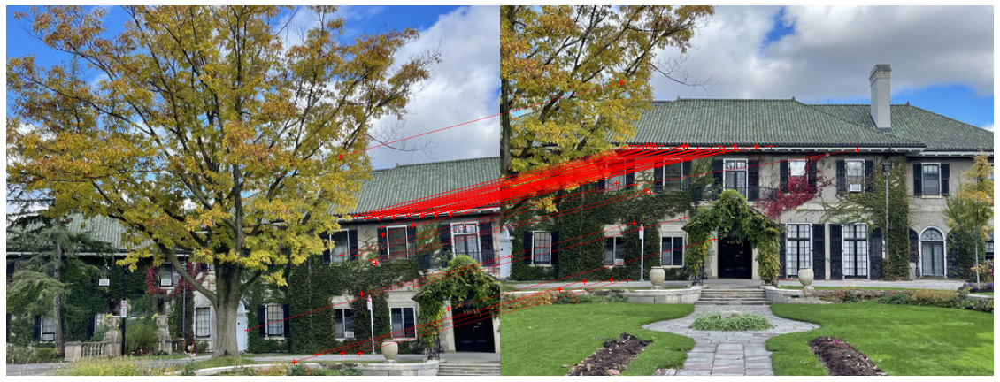

In [108]:
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, glendon_img_left.astype(float) / 255., glendon_img_middle.astype(float) / 255., inliers_best_l_m[:, 0, :])

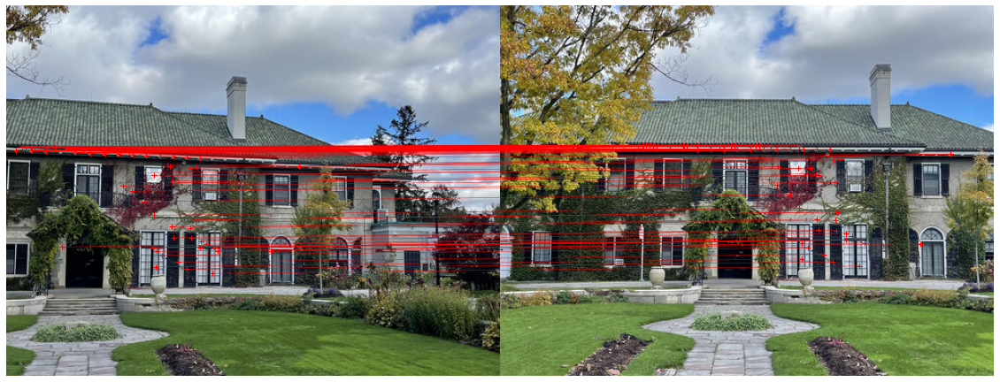

In [109]:
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, glendon_img_right.astype(float) / 255., glendon_img_middle.astype(float) / 255., inliers_best_r_m[:, 0, :])

## 7- Create panorama

To create the panorama first the left and middle images were stiched toghther. Then the stitched image was warpped and stitched to the right one.

In [110]:
def stitch_middle_left_images(img_left, img_middle, H_l):
  # change type
  img_left = img_left.astype(np.double) / 255.
  img_middle = img_middle.astype(np.double) / 255.

  # find corners of transformed left image
  y, x, c = img_left.shape
  corners = [[0, 0, 1], [x, 0, 1], [0, y, 1], [x, y, 1]]
  corners_new = []
  for crnr in corners:
    corners_new.append(np.dot(H_l, crnr))
  corners_new = np.array(corners_new).T

  x_min, y_min = min(corners_new[0] / corners_new[2]), min(corners_new[1] / corners_new[2])

  H_l_new = np.dot(np.array([[1, 0, -x_min], [0, 1, -y_min], [0, 0, 1]]), H_l)
  x_new, y_new = int(round(abs(x_min) + x)), int(round(abs(y_min) + y))
  size = (x_new, y_new)
  
  # warp right image 
  warped_l = cv2.warpPerspective(src=img_left, M=H_l_new, dsize=(img_left.shape[1], img_left.shape[0]))

  # middle image
  y_m, x_m, c_m = img_middle.shape
  size = (int(round(abs(x_min) + x_m)), int(round(abs(y_min) + y_m)))
  warped_m = cv2.warpPerspective(src=img_middle, M= np.array([[1, 0, -1 * x_min], [0, 1, -1 * y_min], [0, 0, 1]]), dsize=size)
  
  print(warped_l.shape, warped_m.shape)
  warped_l_resized = np.zeros((warped_m.shape[0], warped_m.shape[1], 3))
  warped_l_resized[0: warped_l.shape[0] , 0: warped_l.shape[1], :] = warped_l

  stiched_img_l_m = np.maximum(warped_l_resized, warped_m)

  return stiched_img_l_m

(375, 500, 3) (486, 751, 3)


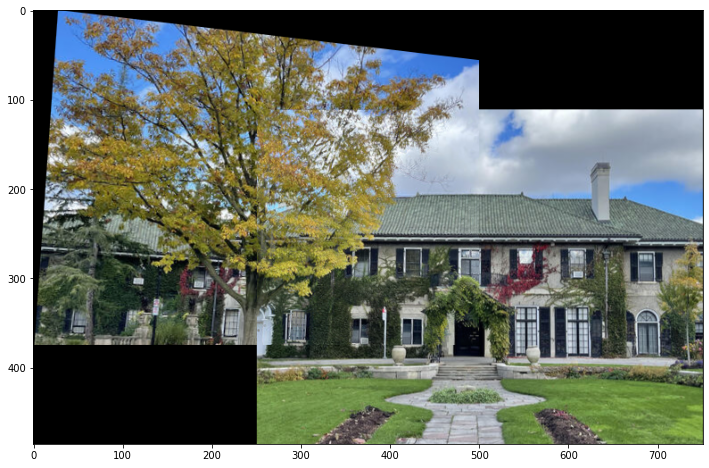

In [128]:
stiched_img = stitch_middle_left_images(glendon_img_left, glendon_img_middle, best_H_l_m)

plt.figure(figsize=(12,12))
plt.imshow(stiched_img)
plt.show()

In [132]:
def stitch_to_right_image(img_stitched, img_right):
  # Find features between stitched image and right image
  img_stitched_temp = img_stitched * 255.
  temp = img_stitched_temp.astype(np.uint8)
  img_stitched_gray = cv2.cvtColor(temp, cv2.COLOR_BGR2GRAY)
  KP_stitched, descriptor_stitched, KP_left_toShow = KPDetection(img_stitched_gray)
  KP_right, descriptor_right ,KP_right_toShow = KPDetection(glendon_img_right_gray)

  # Calculate distance
  dists = calculate_distance(descriptor_stitched, descriptor_right)

  # Prune features
  KP_right_coordinates = cv2.KeyPoint_convert(KP_right)
  KP_stitched_coordinates = cv2.KeyPoint_convert(KP_stitched)

  computed_inliers = prune_features(dists, KP_right_coordinates, KP_stitched_coordinates, thresh=3000)

  # Find Homography
  best_inliers, H = ransac(computed_inliers, iterations=2000, error_thresh=150)
  
  img_right_resized = np.zeros((img_stitched.shape[0], img_stitched.shape[1], 3))
  img_right_resized[0: img_right.shape[0] , 0: img_right.shape[1], :] = img_right

  img_stitched_complete = stitch_middle_left_images(img_stitched * 255, img_right_resized, H)
  
  return img_stitched_complete

(486, 751, 3) (598, 1086, 3)


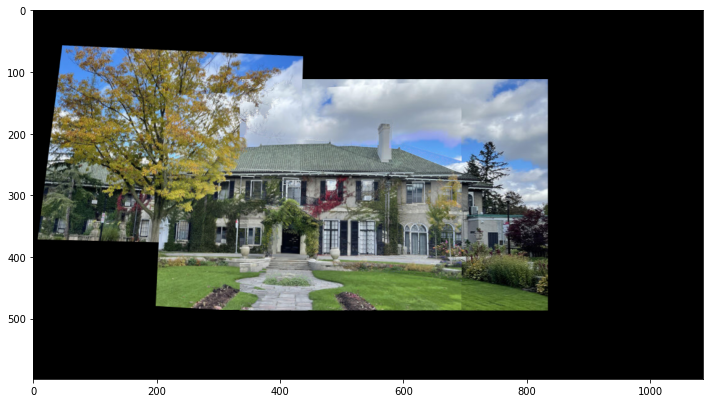

In [133]:
stiched_complete_img = stitch_to_right_image(stiched_img, glendon_img_right)

plt.figure(figsize=(12,12))
plt.imshow(stiched_complete_img)
plt.show()